In [34]:
import pymysql
from collections import defaultdict
import pandas as pd
import sqlalchemy
%matplotlib inline
import requests
from matplotlib.colors import ListedColormap
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
#from colormaps import _magma_data

In [35]:
# Database connection
    conn = pymysql.connect(user='root', password='root', database='acb', host='localhost')

    # Load the data into a Pandas DataFrame
    query = "select * from shotchart"
    shot_df = pd.read_sql(query, conn)
    shot_df
    
    # Load the data into a Pandas DataFrame
    query = "select * from teamname"
    team_df = pd.read_sql(query, conn)
    
    # Load the data into a Pandas DataFrame
    query = "select * from actor"
    actor_df = pd.read_sql(query, conn)

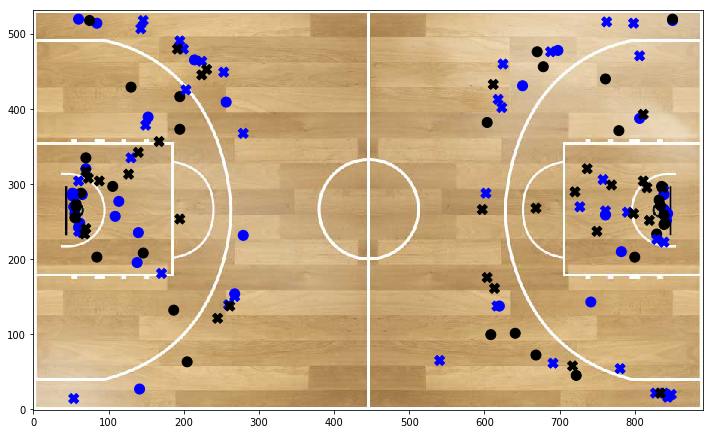

In [36]:
img=mpimg.imread('fiba_courtonly.png')

game_shotchart = shot_df[shot_df.game_acbid == 83007]
teams=game_shotchart.team_id.unique()

colors = np.where(game_shotchart.team_id==teams[0],'blue','black')
aux1=game_shotchart[game_shotchart['scored']==1]
aux2=game_shotchart[game_shotchart['scored']==0]
colors1=np.where(aux1.team_id==teams[0],'blue','black')
colors2=np.where(aux2.team_id==teams[0],'blue','black')

plt.figure(figsize=(12,22))
plt.scatter(aux1.left_px*img.shape[1]/100,aux1.bottom_px*img.shape[0]/100,c=colors1,marker='o',s=100)
plt.scatter(aux2.left_px*img.shape[1]/100,aux2.bottom_px*img.shape[0]/100,c=colors2,marker='X',s=100)

imgplot = plt.imshow(img, origin='lower')
plt.show()

(532, 891, 3)


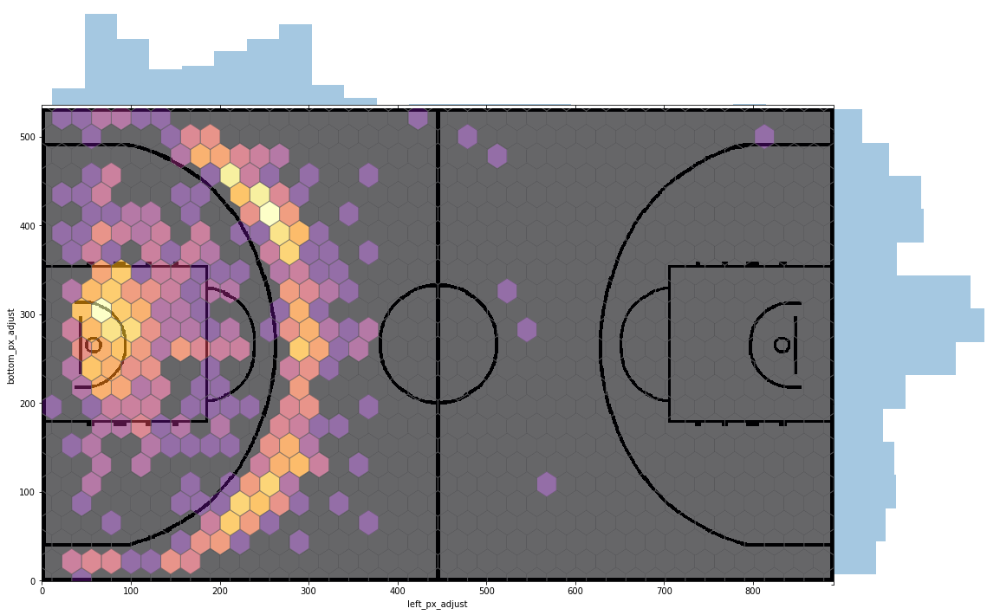

In [6]:
# create our jointplot
aux_df=shot_df[(shot_df.actor_id==9)]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut_WB.png')
print(img.shape)

cmap=plt.cm.inferno
cmap2=plt.cm.inferno

# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.bottom_px_adjust*img.shape[0]/100,
                                alpha=0,space=0)


joint_shot_chart.plot_joint(plt.hexbin, gridsize=40,bins='log', extent=[img.shape[1], 0, 0, 1000],
                            alpha=0.6, cmap=plt.cm.inferno,color="#666668")

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint
ax.imshow(img, origin='lower')

plt.show()

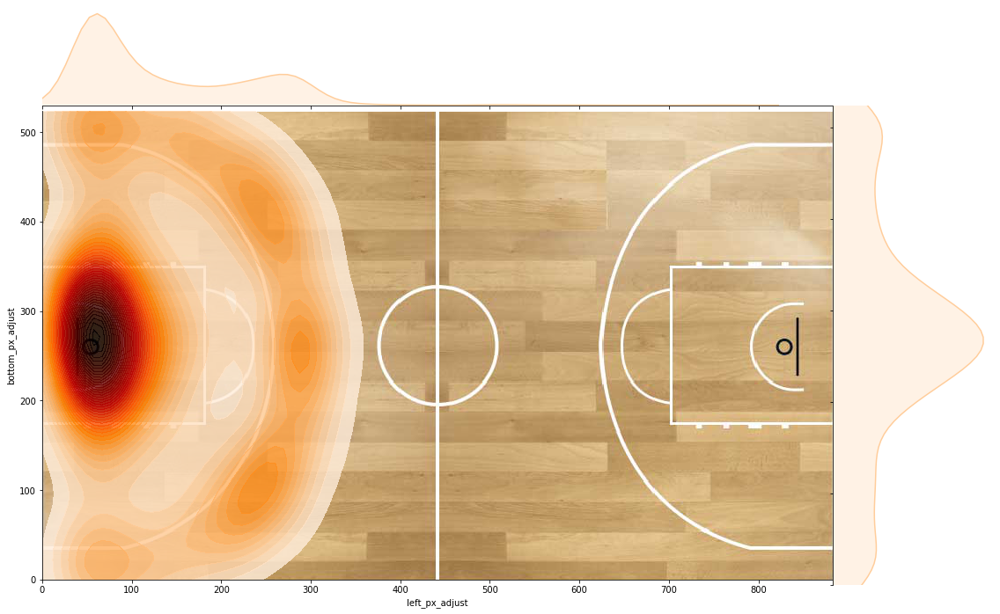

In [8]:
from matplotlib.offsetbox import  OffsetImage

# create our jointplot
aux_df=shot_df[(shot_df.team_id==1) & (shot_df.game_acbid>=63000)]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')

cmap=plt.cm.gist_heat_r

# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.bottom_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde', space=0, color=cmap(0.1),
                                 cmap=cmap,n_levels=50, alpha=0.8,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"shade_lowest":False})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint
ax.imshow(img, origin='lower')

plt.show()

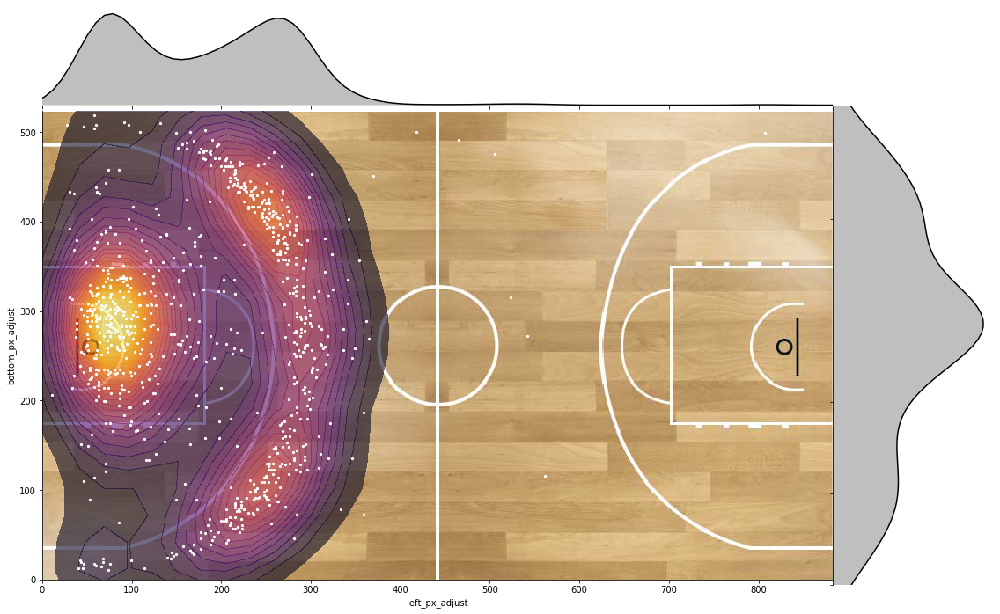

In [9]:
# create our jointplot
aux_df=shot_df[(shot_df.actor_id==9) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.inferno


# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.bottom_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(1),
                                 cmap=cmap, n_levels=30,alpha=0.6,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30,"shade_lowest":False})

joint_shot_chart.plot_joint(plt.scatter, c="w", s=5, linewidth=1, marker="o")


joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)


# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')

plt.show()

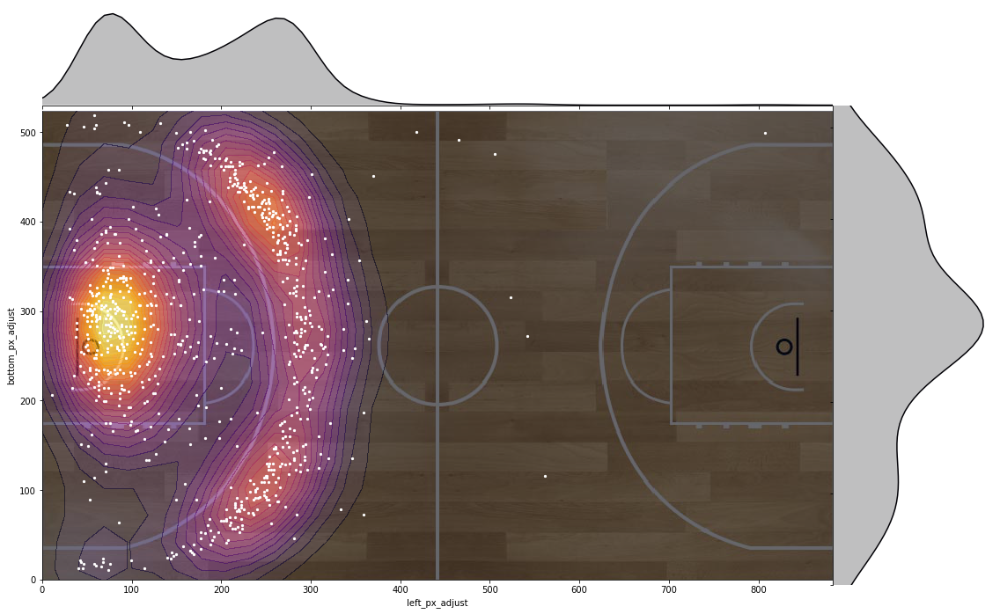

In [11]:
# create our jointplot
aux_df=shot_df[(shot_df.actor_id==9) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.inferno


# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.bottom_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(1),
                                 cmap=cmap, n_levels=30,alpha=0.6,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30})

joint_shot_chart.plot_joint(plt.scatter, c="w", s=5, linewidth=1, marker="o")


joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)


# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')

plt.show()

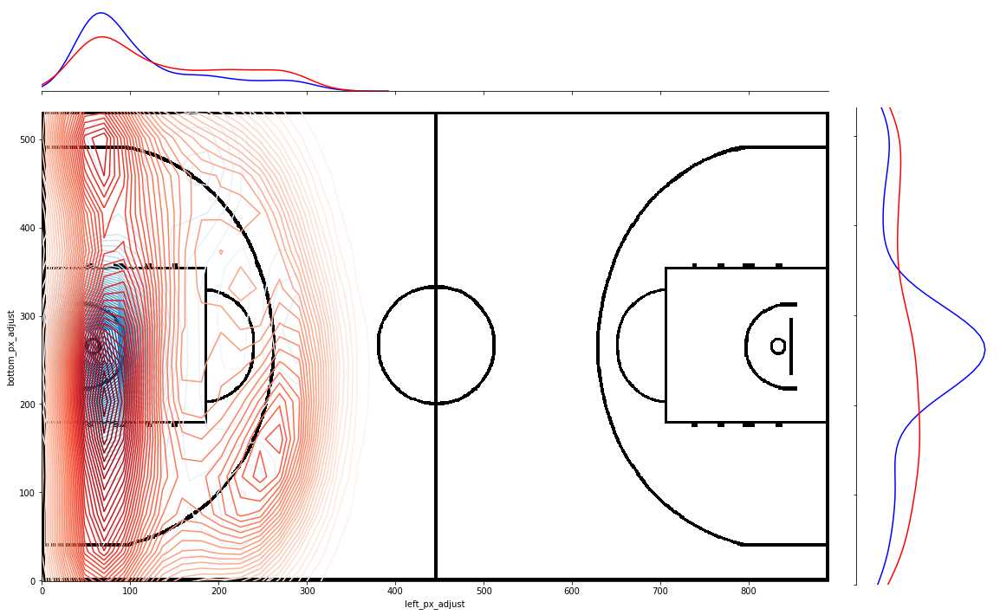

In [14]:
# create our jointplot
aux_df_scored=shot_df[(shot_df.actor_id==2)&(shot_df.scored==1)]
aux_df
aux_df_missed=shot_df[(shot_df.actor_id==2)&(shot_df.scored==0)]

# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut_WB.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.inferno


# n_levels sets the number of contour lines for the main kde plot
g = sns.JointGrid(x="left_px_adjust",y="bottom_px_adjust",data=aux_df)

sns.kdeplot(aux_df_scored.left_px_adjust*img.shape[1]/100, aux_df_scored.bottom_px_adjust*img.shape[0]/100, cmap="Blues",
            n_levels=50, shade_lowest=True, ax=g.ax_joint,cut=30)

sns.kdeplot(aux_df_missed.left_px_adjust*img.shape[1]/100, aux_df_missed.bottom_px_adjust*img.shape[0]/100, cmap="Reds",
            n_levels=50, shade_lowest=True, ax=g.ax_joint,cut=30)

sns.kdeplot(aux_df_scored.left_px_adjust*img.shape[1]/100, color="b", legend=False,  
             ax=g.ax_marg_x)
sns.kdeplot(aux_df_missed.left_px_adjust*img.shape[1]/100, color="r", legend=False, 
             ax=g.ax_marg_x)
sns.kdeplot(aux_df_scored.bottom_px_adjust*img.shape[0]/100, color="b", legend=False, 
             ax=g.ax_marg_y, vertical=True)
sns.kdeplot(aux_df_missed.bottom_px_adjust*img.shape[0]/100, color="r", legend=False, 
             ax=g.ax_marg_y, vertical=True)

g.fig.set_figwidth(img.shape[1]/100*2)
g.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = g.ax_joint

ax.imshow(img, origin='lower')



plt.show()

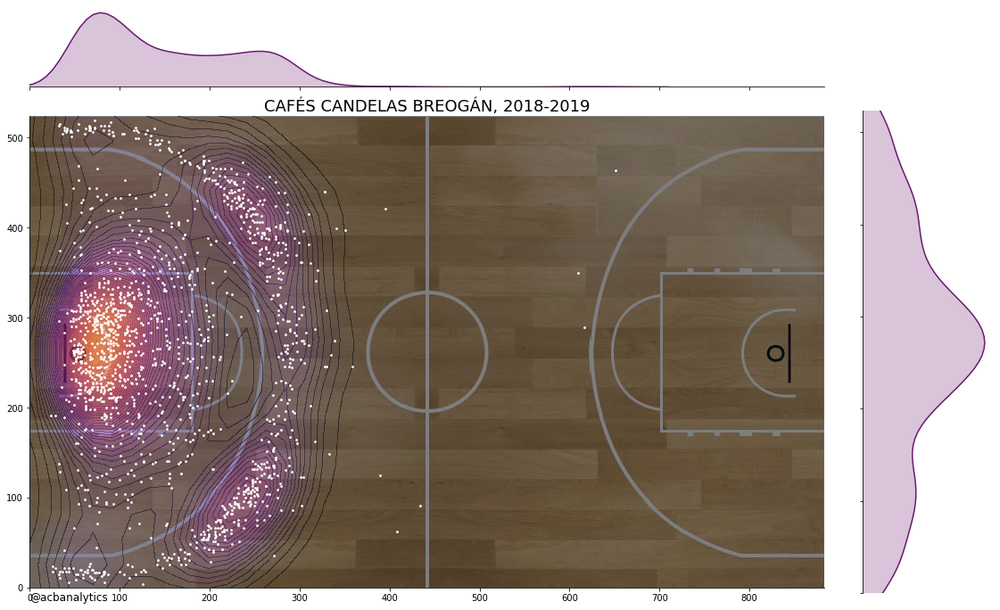

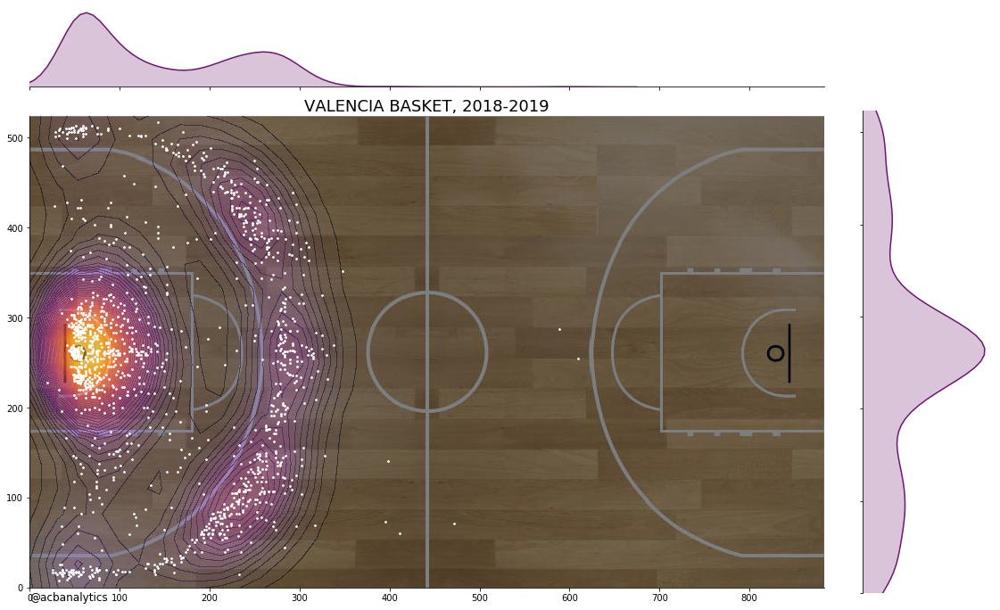

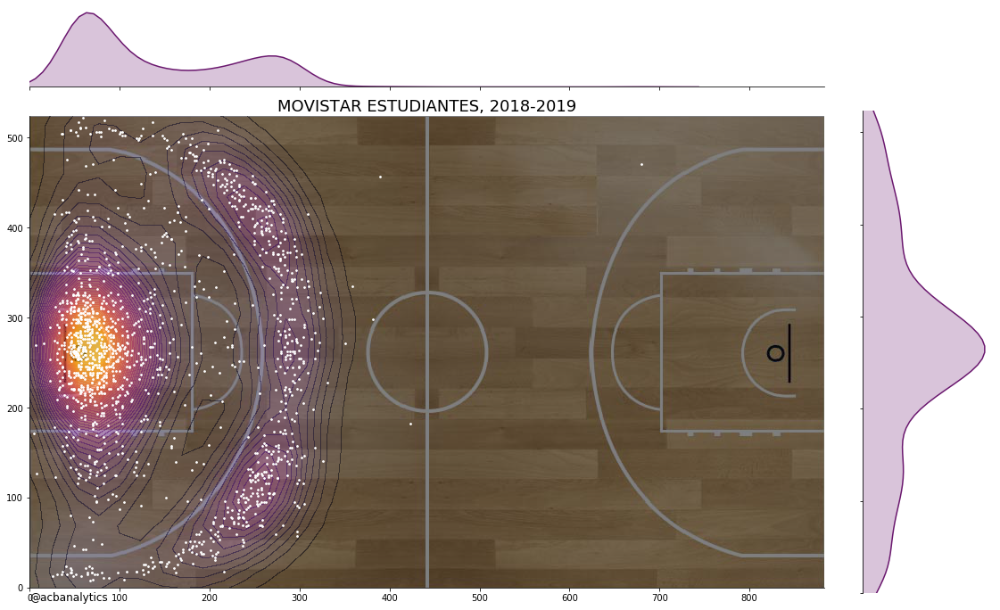

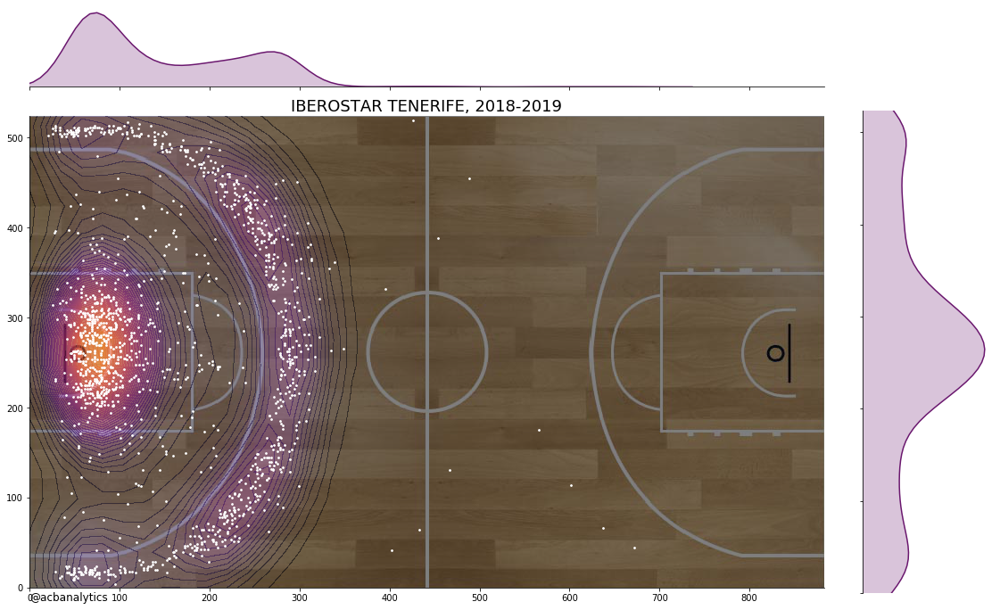

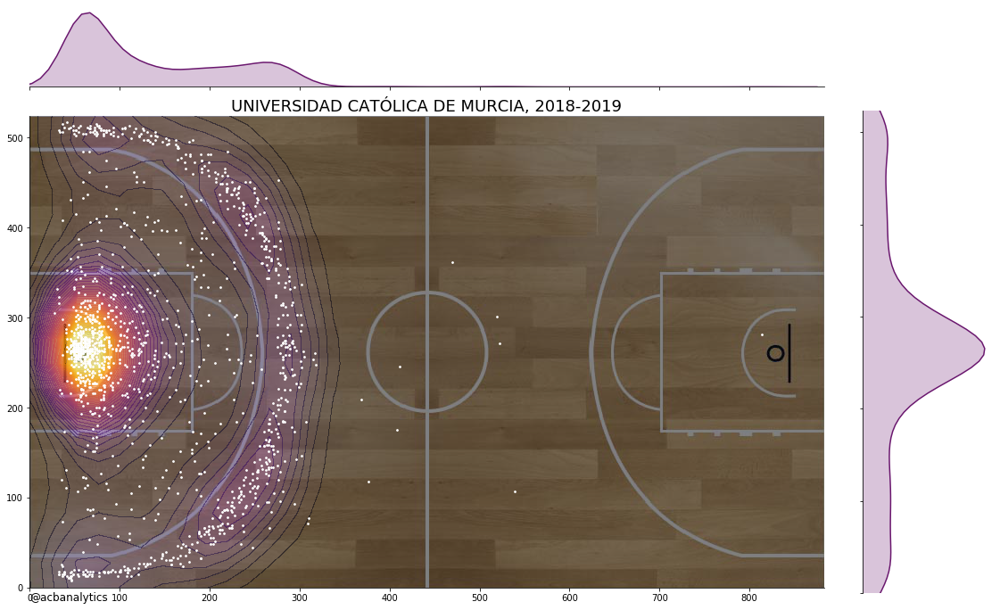

...

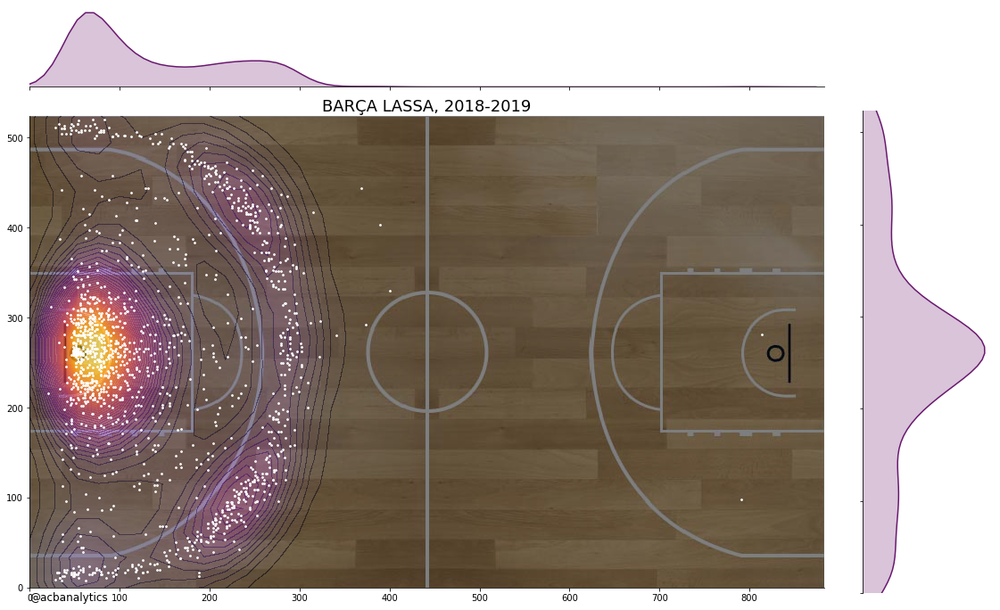

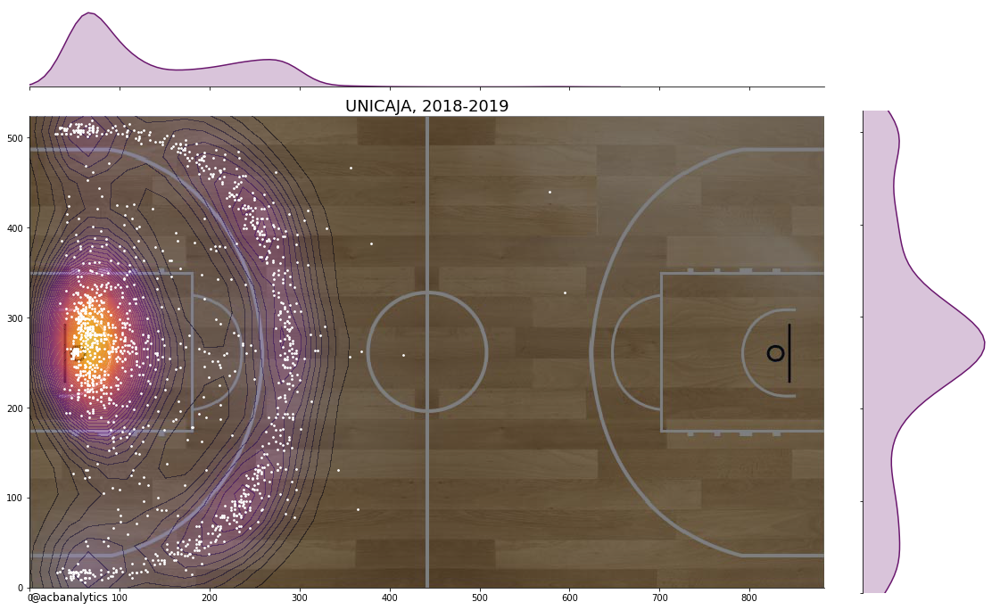

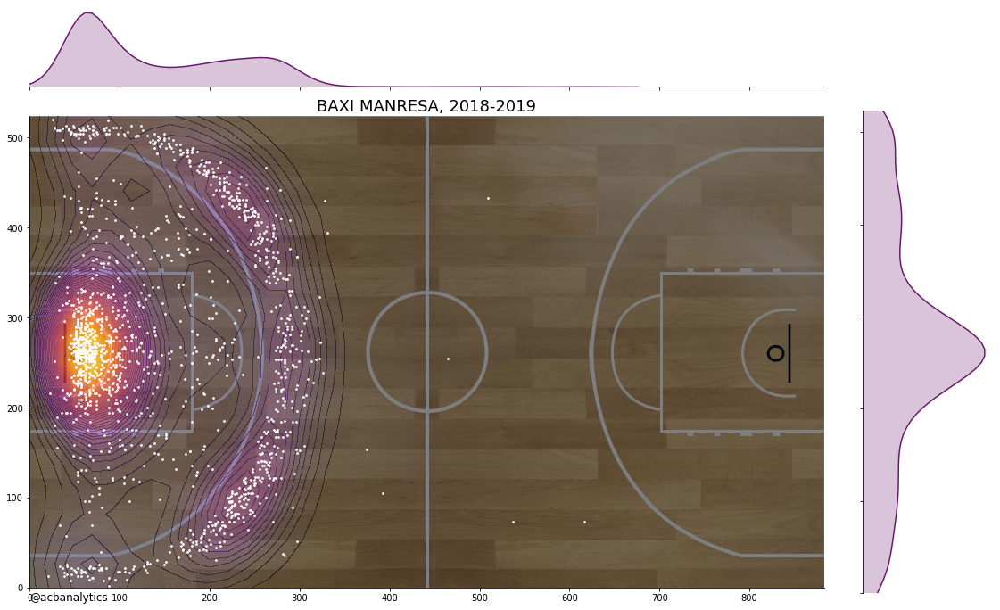

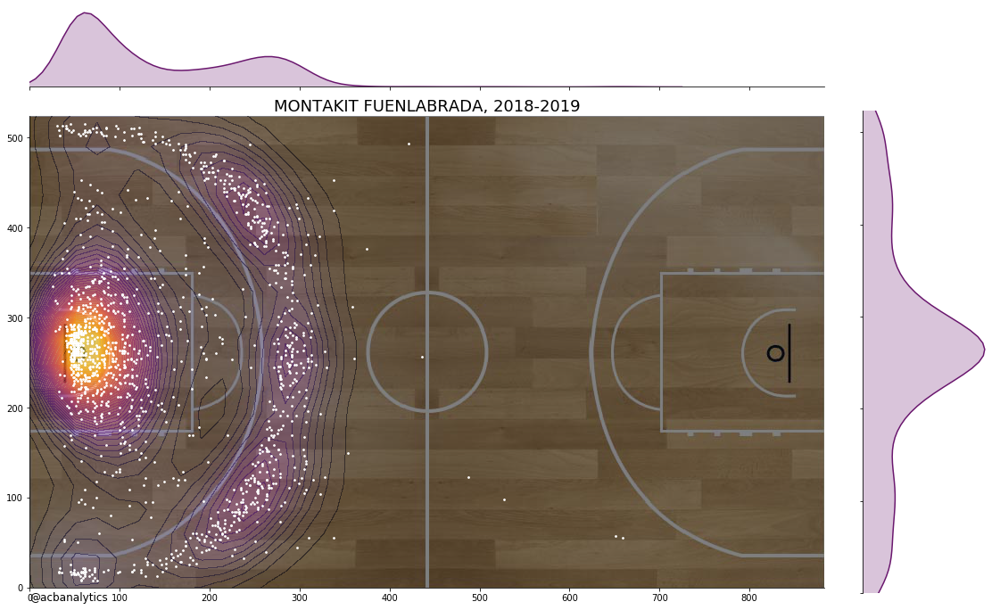

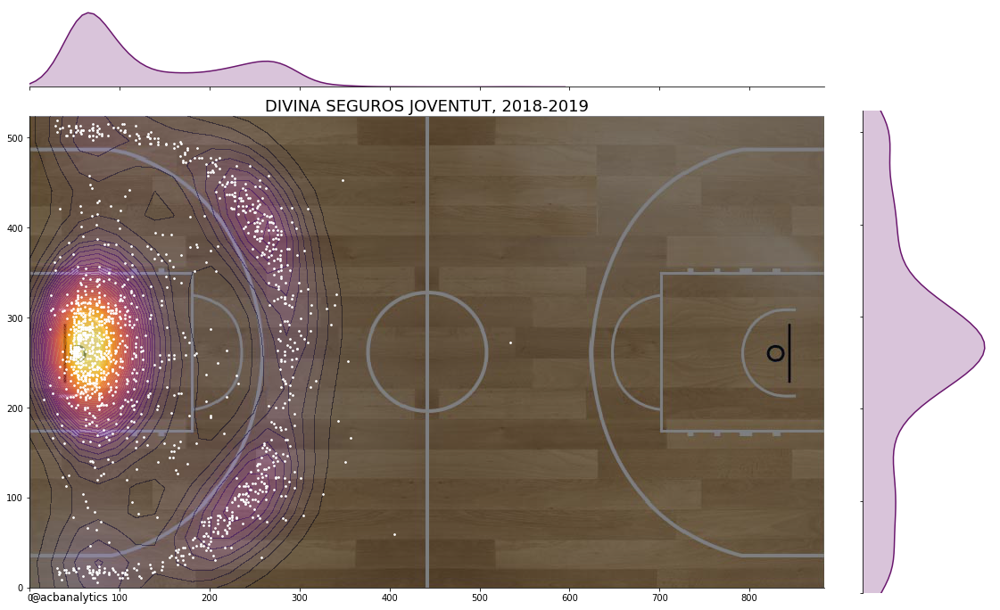

In [15]:
from matplotlib.offsetbox import  OffsetImage
import palettable

df_season=shot_df[(shot_df.game_acbid>=63000)]

teams=df_season['team_id'].unique()
for team in teams:
    # create our jointplot
    aux_df=df_season[(df_season.team_id==team)]
    team_name=team_df.name[(team_df.team_id==team)].iloc[-1]

    # get our colormap for the main kde plot
    # Note we can extract a color from cmap to use for 
    # the plots that lie on the side and top axes
    img=mpimg.imread('fiba_courtonly_cut.png')

    # construct cmap
    # Register and set Viridis as the colormap for the plot
    cmap=plt.cm.inferno

    # n_levels sets the number of contour lines for the main kde plot
    joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.bottom_px_adjust*img.shape[0]/100, 
                                    stat_func=None,
                                     kind='kde',space=0.3,color=cmap(0.3),
                                     cmap=cmap, n_levels=50,alpha=0.5,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                     joint_kws={"cut":30,"vmin":0,"vmax":0.0000420})

    joint_shot_chart.plot_joint(plt.scatter, c="w", s=3, linewidth=1, marker="o")
    
    # A joint plot has 3 Axes, the first one called ax_joint 
    # is the one we want to draw our court onto and adjust some other settings
    ax = joint_shot_chart.ax_joint
    
     # Get rid of axis labels and tick marks
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    # Add a title
    ax.set_title('{}, 2018-2019'.format(team_name), y=1.2, fontsize=18)
    
    # Add Data Scource and Author
    ax.text(0,-15,'@acbanalytics',fontsize=12)

    ax.imshow(img, origin='lower')
    #plt.title(label=team,fontdict={'fontsize':20},loc="center")
    
    joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
    joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)
    
    plt.show()

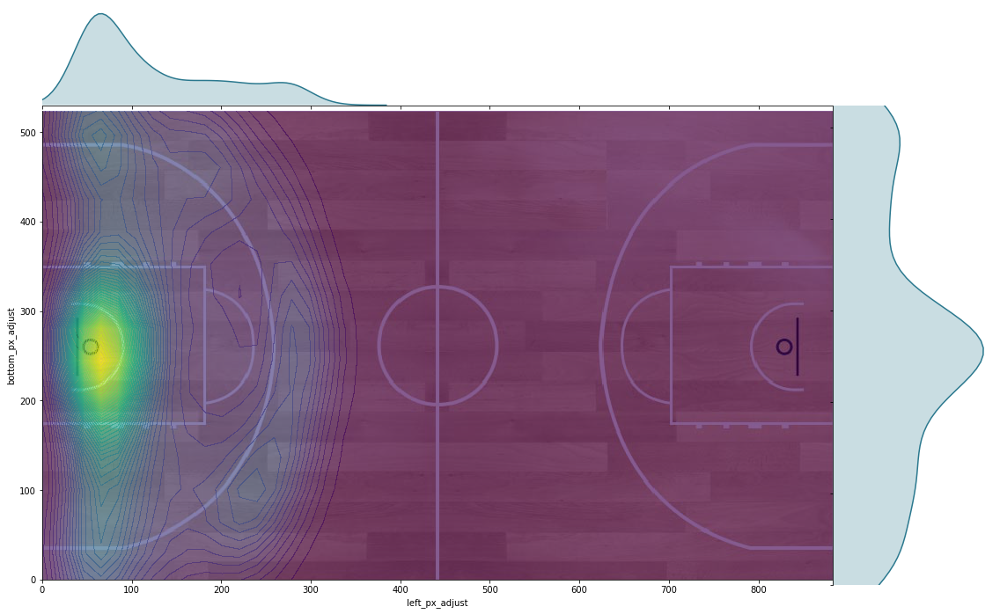

In [16]:
from matplotlib.offsetbox import  OffsetImage
import palettable
from matplotlib.colors import ListedColormap

# create our jointplot
aux_df=shot_df[(shot_df.actor_id==2) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')


# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.viridis



# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.bottom_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(0.4),
                                 cmap=cmap, n_levels=50,alpha=0.65,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')



plt.show()

In [18]:
aux_df=shot_df[(shot_df.team_id==1) | (shot_df.team_id==2) | (shot_df.team_id==3)
               | (shot_df.team_id==6)| (shot_df.team_id==8)| (shot_df.team_id==9)
               | (shot_df.team_id==13)| (shot_df.team_id==18) & (shot_df.game_acbid>=63000)]

aux_df_final=aux_df.copy()
aux_df_final['left_m_adjust']=(aux_df_final['left_px_adjust']*28)/100
aux_df_final['bottom_m_adjust']=(aux_df_final['bottom_px_adjust']*15)/100

center=1.575,7.5

aux_df_final['distance']=aux_df_final.apply(lambda row: math.sqrt((row['left_m_adjust']-center[0])**2+(row['bottom_m_adjust']-center[1])**2), axis=1)
aux_df_final

actor_dist={}
actors=df_season['actor_id'].unique()
for actor in actors:
    #print(actor)
    
    actor_df=aux_df_final[(aux_df_final.actor_id==actor)]
    actor_df['sum']=1
    suma=actor_df['sum'].sum()
    if suma >= 20:
        actor_dist[actor]=actor_df["distance"].mean()
    
actor_dist

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


{28: 4.171637780024496,
 30: 5.8894432141197255,
 31: 3.1552035184789586,
 29: 3.356094648675106,
 34: 5.556318983409388,
 32: 3.542449098489316,
 27: 5.31210057754029,
 35: 3.9458376624914777,
 36: 6.124264840590556,
 155: 2.721120015047241,
 202: 5.385036409454912,
 24: 5.132554207543599,
 257: 5.584795194646655,
 16: 1.5135615972001613,
 25: 4.945288964960134,
 22: 6.098050035132873,
 261: 6.122944004616753,
 18: 1.3131281537012485,
 19: 5.849914562257212,
 20: 5.443126983724477,
 14: 5.749699896821927,
 122: 5.309660343472957,
 152: 3.9037130001469427,
 151: 1.3787045706979815,
 33: 5.529766750915838,
 10: 2.9457871178364763,
 9: 5.457500682354192,
 8: 1.3089456491036502,
 1: 4.107971721576343,
 2: 4.614320669754379,
 5: 1.9502063494151365,
 4: 4.848981100476743,
 11: 6.630324990796897,
 3: 6.010052095521659,
 39: 1.2471838008104046,
 7: 5.387394583330083,
 68: 6.201388075962794,
 77: 4.557897471060257,
 176: 4.016206748959297,
 178: 6.074445514932472,
 183: 4.020271590711323,
 177

In [19]:
actor_dist
#final_df=pd.DataFrame(actor_dist.items(),columns=['Date', 'DateValue']) 
#final_df
df = pd.DataFrame(list(actor_dist.items()), columns=['actor_id', 'distance'])
df=df.dropna()
df=df.sort_values('distance')
df

,actor_id,distance
114,60,1.116938
82,49,1.127327
94,136,1.240569
34,39,1.247184
27,8,1.308946
17,18,1.313128
46,181,1.330820
23,151,1.378705
113,40,1.379207
84,46,1.456836


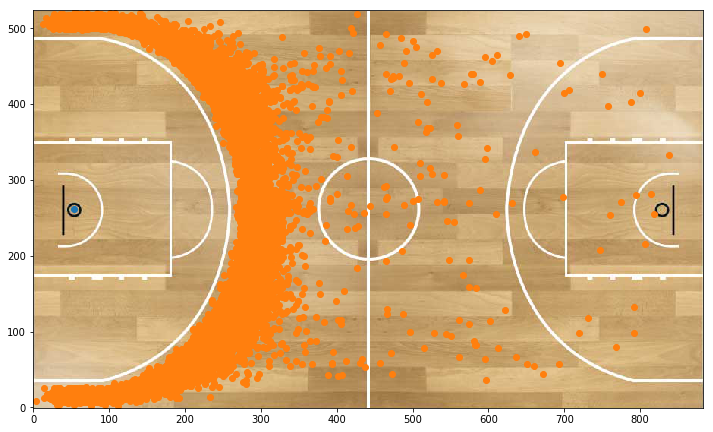

883

In [21]:
img=mpimg.imread('fiba_courtonly_cut.png')
aux_df=aux_df[aux_df.distance>=6.75]

plt.figure(figsize=(12,22))
plt.scatter(6*img.shape[1]/100,50*img.shape[0]/100)
plt.scatter(aux_df.left_px_adjust*img.shape[1]/100,aux_df.bottom_px_adjust*img.shape[0]/100)

imgplot = plt.imshow(img, origin='lower')
plt.show()
img.shape[0]
img.shape[1]

In [22]:
df_mandarinas=shot_df[(shot_df['distance']>=20) & (shot_df['game_acbid']>=63000)]
df_mandarinas

,id,shotchart_game_acbid,game_acbid,team_id,actor_id,jersey,scored,period,shot,shot_type,bottom_px,left_px,bottom_px_adjust,left_px_adjust,left_m_adjust,bottom_m_adjust,distance
475,476,977779,63010,1,4,7,0,1,3PT,None,24.150,14.208,75.850,85.792,24.02176,11.37750,22.779202
5627,5628,977770,63002,6,174,3,0,2,3PT,None,13.265,21.311,86.735,78.689,22.03292,13.01025,21.187009
7701,7702,977999,63136,17,240,40,0,3,3PT,None,11.905,78.142,11.905,78.142,21.87976,1.78575,21.093504
8677,8678,977886,63091,4,100,31,1,1,2PT,layup,57.483,6.922,42.517,93.078,26.06184,6.37755,24.512552
9787,9788,977912,63100,2,63,30,0,1,3PT,None,18.707,89.617,18.707,89.617,25.09276,2.80605,23.981622
11102,11103,978033,63167,9,15,1,0,3,3PT,None,8.503,76.138,8.503,76.138,21.31864,1.27545,20.701602
14379,14380,977976,63126,8,134,9,1,OT,3PT,None,10.544,74.681,10.544,74.681,20.91068,1.58160,20.221177
14665,14666,977832,63061,17,74,23,0,2,2PT,tip,53.741,92.168,53.741,92.168,25.80704,8.06115,24.238537
16944,16945,977801,63032,7,203,8,0,3,3PT,None,10.204,22.951,89.796,77.049,21.57372,13.46940,20.870614
17134,17135,977806,63036,16,112,13,0,2,3PT,None,51.020,83.060,51.020,83.060,23.25680,7.65300,21.682340


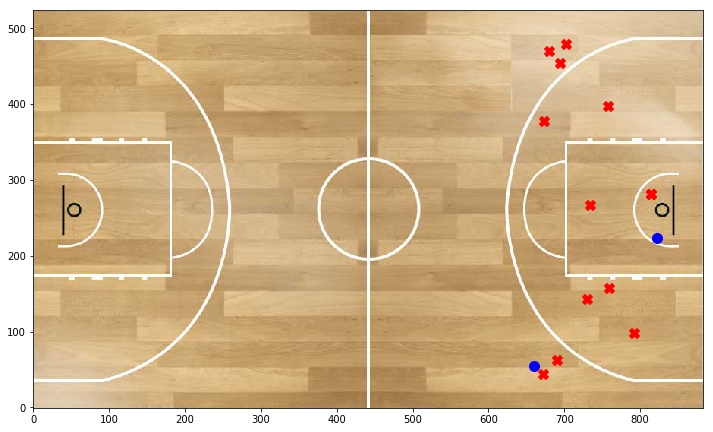

In [24]:
img=mpimg.imread('fiba_courtonly_cut.png')

aux1=df_mandarinas[df_mandarinas['scored']==1]
aux2=df_mandarinas[df_mandarinas['scored']==0]
colors1=np.where(aux1.team_id==teams[0],'blue','black')
colors2=np.where(aux2.team_id==teams[0],'blue','black')

plt.figure(figsize=(12,22))
plt.scatter(aux1.left_px_adjust*img.shape[1]/100,aux1.bottom_px_adjust*img.shape[0]/100,c="Blue",marker='o',s=100)
plt.scatter(aux2.left_px_adjust*img.shape[1]/100,aux2.bottom_px_adjust*img.shape[0]/100,c="red",marker='X',s=100)

imgplot = plt.imshow(img, origin='lower')
plt.show()

In [25]:
# Database connection
conn = pymysql.connect(user='root', password='root', database='acb', host='localhost')

# Load the data into a Pandas DataFrame
query = "SELECT * FROM acb.shotchart LEFT JOIN acb.actor on shotchart.actor_id = actor.id where (actor.position='P') and shotchart.distance<=2.45 and shotchart.team_id!=8 and shotchart.game_acbid>=63000"
shot_df_aux = pd.read_sql(query, conn)
shot_df_aux

,id,shotchart_game_acbid,game_acbid,team_id,actor_id,jersey,scored,period,shot,shot_type,...,full_name,nationality,birth_place,birth_date,position,height,weight,license,debut_acb,twitter
0,3,978012,63149,15,163,21,1,1,2PT,jumpshot,...,Alec Thomas Brown,USA,Winona (EE.UU.),1992-07-23,P,2.16,107.0,EXT,None,None
1,11,978012,63149,15,256,19,0,1,2PT,jumpshot,...,Emir Sulejmanovic,FIN,Zepa,1995-07-13,P,2.04,NaN,EUR,None,None
2,26,978012,63149,15,167,52,1,2,2PT,tip,...,Volodymyr Gerun,UKR,Dnipropetrovsk (Ucrania),1994-03-25,P,2.08,NaN,EUR,None,None
3,40,978012,63149,15,163,21,1,3,2PT,jumpshot,...,Alec Thomas Brown,USA,Winona (EE.UU.),1992-07-23,P,2.16,107.0,EXT,None,None
4,47,978012,63149,15,256,19,1,4,2PT,jumpshot,...,Emir Sulejmanovic,FIN,Zepa,1995-07-13,P,2.04,NaN,EUR,None,None
5,52,978012,63149,15,163,21,1,4,2PT,dunk,...,Alec Thomas Brown,USA,Winona (EE.UU.),1992-07-23,P,2.16,107.0,EXT,None,None
6,55,978012,63149,15,256,19,0,4,2PT,jumpshot,...,Emir Sulejmanovic,FIN,Zepa,1995-07-13,P,2.04,NaN,EUR,None,None
7,58,978012,63149,15,256,19,1,4,2PT,jumpshot,...,Emir Sulejmanovic,FIN,Zepa,1995-07-13,P,2.04,NaN,EUR,None,None
8,66,978012,63149,18,29,7,1,1,2PT,dunk,...,Louis Labeyrie,FRA,Gonesse (Francia),1992-02-11,P,2.08,100.0,EUR,None,None
9,72,978012,63149,18,32,14,0,1,2PT,jumpshot,...,Bojan Dubljevic,MNE,Niksic (Montenegro),1991-10-24,P,2.05,105.0,EUR,None,None


In [26]:
shot_df_scored=shot_df_aux[shot_df_aux['scored']==1]
shot_df_missed=shot_df_aux[shot_df_aux['scored']==0]
shot_df_missed['scored']=1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [27]:
print(shot_df_missed.shape)
print(shot_df_scored.shape)

shot_df_scored=shot_df_scored.groupby(['team_id']).sum()

shot_df_missed=shot_df_missed.groupby(['team_id']).sum()

(1096, 31)
(2087, 31)


In [28]:
shot_df_scored['scored']=shot_df_scored['scored']/10
print(shot_df_scored['scored'])
print(shot_df_scored['scored'].mean())

shot_df_missed['scored']=shot_df_missed['scored']/20
print(shot_df_missed['scored'])
print(shot_df_missed['scored'].mean())

team_id
1     12.0
2     14.8
3     15.7
4     11.8
5     11.1
6     16.9
7     12.5
9     13.4
10     8.9
11    14.8
12    13.8
13     8.1
14     5.7
15    16.6
16     5.7
17    10.7
18    16.2
Name: scored, dtype: float64
12.276470588235293
team_id
1     2.30
2     3.60
3     4.55
4     3.35
5     2.90
6     3.95
7     3.45
9     2.65
10    2.50
11    4.20
12    4.25
13    2.40
14    1.70
15    4.30
16    1.70
17    3.05
18    3.95
Name: scored, dtype: float64
3.223529411764706


In [29]:
# Database connection
conn = pymysql.connect(user='root', password='root', database='acb', host='localhost')

# Load the data into a Pandas DataFrame
query = "SELECT DISTINCT game_acbid FROM acb.event WHERE team_id = 8 AND game_acbid > 63000"
tenerife_df = pd.read_sql(query, conn)

list_games = tenerife_df['game_acbid'].tolist()
list_games= ','.join(str(e) for e in list_games)
print("Lista de sus partidos: " + list_games)
query = "SELECT * FROM acb.shotchart LEFT JOIN acb.actor on shotchart.actor_id = actor.id WHERE game_acbid IN (%s) and team_id!=8 and shotchart.distance<=2.45 and (actor.position='P')" % list_games
tenerife_df = pd.read_sql(query, conn)

Lista de sus partidos: 63155,63035,63087,63128,63110,63077,63188,63170,63060,63024,63045,63046,63147,63126,63142,63175,63070,63103,63015,63009,63096,63193,63203


In [30]:
tenerife_df_scored=tenerife_df[tenerife_df['scored']==1]
tenerife_df_missed=tenerife_df[tenerife_df['scored']==0]

tenerife_df_scored=tenerife_df_scored.groupby(['team_id']).sum()
tenerife_df_scored

,id,shotchart_game_acbid,game_acbid,actor_id,jersey,scored,bottom_px,left_px,bottom_px_adjust,left_px_adjust,left_m_adjust,bottom_m_adjust,distance,id,is_coach,height,weight
team_id,,,,,,,,,,,,,,,,,
1,132856,12712995,820420,94,246,13,655.442,873.952,645.238,83.608,23.41024,96.78570,4.840675,94,0,27.95,0.0
2,220685,17603394,1136460,2833,255,18,874.489,885.247,920.749,132.059,36.97652,138.11235,12.981162,2833,0,38.12,476.0
3,166575,7822272,504120,386,190,8,411.564,402.004,416.326,51.914,14.53592,62.44890,4.789598,386,0,16.64,570.0
4,333247,8801394,568101,937,238,9,444.558,138.615,459.524,57.559,16.11652,68.92860,5.645125,937,0,18.87,412.0
5,73977,4890025,315710,945,50,5,264.625,200.000,252.381,33.880,9.48640,37.85715,4.073472,945,0,10.50,500.0
6,28055,7822440,504280,1430,96,8,391.497,314.755,396.259,47.541,13.31148,59.43885,2.283597,1430,0,16.88,0.0
7,83657,10756711,693848,1977,544,11,541.837,412.569,556.803,71.583,20.04324,83.52045,8.837569,1977,0,23.02,0.0
9,129685,9780100,631470,166,49,10,474.149,500.729,478.231,90.711,25.39908,71.73465,13.434202,166,0,21.18,812.0
10,75419,11735191,757479,1161,489,12,594.898,598.361,576.532,74.863,20.96164,86.47980,6.679354,1161,0,24.96,0.0


In [31]:
tenerife_df_scored['scored']=tenerife_df_scored['scored']

tenerife_df_scored
print(tenerife_df_scored['scored'].sum())

tenerife_df_missed['scored']=tenerife_df_missed['scored']
tenerife_df_missed
print(tenerife_df_missed['scored'].sum())

146
0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [32]:
(163-7.5-9.5-9)/17*2

16.11764705882353